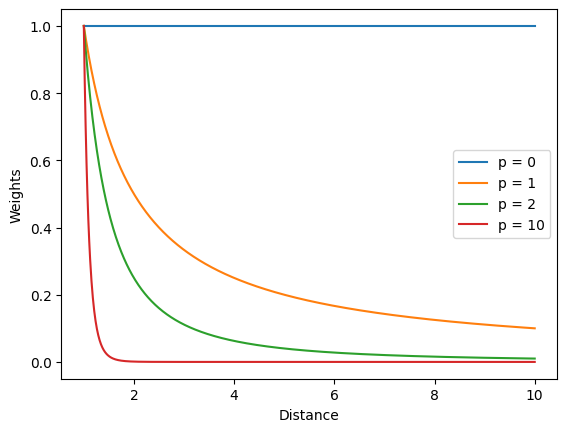

In [2]:
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(1, 10, 1000)

y0 = np.ones_like(x)
y1 = 1 / x
y2 = 1 / x ** 2
y3 = 1 / x ** 10

plt.plot(x, y0, label='p = 0')
plt.plot(x, y1, label='p = 1')
plt.plot(x, y2, label='p = 2')
plt.plot(x, y3, label='p = 10')

# plt.title("Different p on IDW")
plt.ylabel("Weights")
plt.xlabel("Distance")
plt.legend()
plt.show()

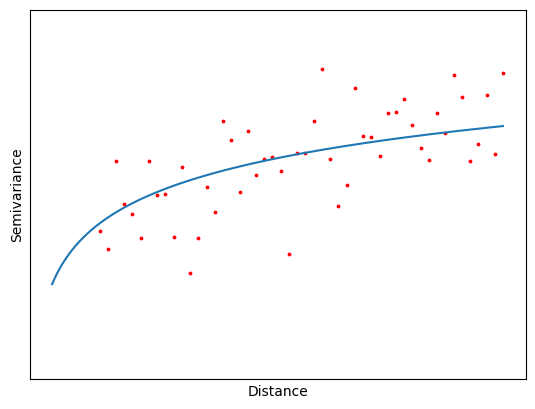

In [3]:
import numpy as np
import matplotlib.pyplot as plt

x1 = np.linspace(5, 100, 1000)
y1 = -1 * x1 ** -0.05 

x2 = np.linspace(15, 100, 50)
y2 = -1 * x2 ** -0.05 + np.random.normal(0, 0.03, 50)

plt.plot(x1, y1)
plt.scatter(x2, y2, s=3, color='red')

plt.ylabel("Semivariance")
plt.xlabel("Distance")

plt.xticks([])
plt.yticks([])

plt.ylim(-1.0, -0.7)

plt.show()

In [29]:
import pandas as pd
from tqdm.contrib.concurrent import process_map

def get_fill_rate(data: tuple[dict, pd.DataFrame]):
    meta, data = data
    total = sum(data["dep"] <= meta["max_dep"])
    return len(data[data["dep"] <= meta["max_dep"]].dropna()) / total if total > 0 else 0


vae_train_data = pd.read_pickle("data/vae_train_data.pkl")

vae_data_list = [(meta, data) for (meta, data) in vae_train_data if meta["max_dep"] >= 50]
fill_rate = process_map(get_fill_rate, vae_data_list, max_workers=12, chunksize=2000)

  0%|          | 0/55273 [00:00<?, ?it/s]

In [47]:
import plotly.express as px
import numpy as np

missing_rate = np.array([1 - rate for rate in fill_rate])
df = pd.DataFrame(missing_rate, columns=["missing_rate"])

fig = px.histogram(
    df,
    x="missing_rate",
    marginal="violin",
    nbins=40,
    width=600,
    height=400,
)


fig.update_layout(
    xaxis_title_text='Profile Missing Rate', 
    yaxis_title_text='Profile Count',
    margin=dict(l=80, r=20, t=20, b=60),
)


fig.show()

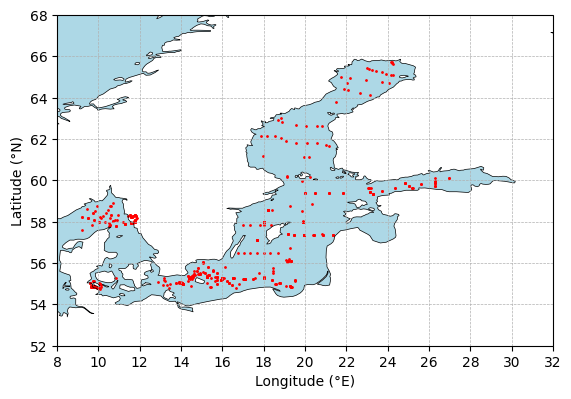

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature

projection = ccrs.PlateCarree()
fig, ax = plt.subplots(subplot_kw={"projection": projection})

ax.coastlines(linewidth=0.5)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')


meta = [(meta['lon'], meta['lat']) for meta, _ in vae_train_data if meta['year'] == 2000]
lon, lat = zip(*meta)
ax.scatter(lon, lat, s=1, color='red')

plt.xlabel("Longitude (°E)")
plt.xlim(8, 32)
plt.xticks(np.arange(8, 32 + 1, 2))

plt.ylabel("Latitude (°N)")
plt.ylim(52, 68)
plt.yticks(np.arange(52, 68 + 1, 2))

plt.grid(True, linestyle="--", linewidth=0.5)
plt.show()

In [46]:
import plotly.express as px
import pandas as pd

df = pd.read_parquet("data/train_data.parquet")
groups = df.groupby(["year", "mon", "lon", "lat"])

meta = groups.indices.keys()
df_meta = pd.DataFrame(meta, columns=["year", "mon", "lon", "lat"])


fig = px.histogram(
    df_meta,
    x="year",
    marginal="box",
    nbins=62,
    width=800,
    height=400,
)

fig.update(layout_showlegend=False)
fig.update_layout(
    xaxis_title_text="Year",
    yaxis_title_text="Profile Count",
    margin=dict(l=80, r=20, t=20, b=60),
)

fig.show()


# fig = ff.create_distplot([df_meta['year']], group_labels=['year'], bin_size=2, show_rug=False)
# fig.update_layout(width=800, height=400)
# fig.show()

In [19]:

from scipy.stats import gaussian_kde


df_meta['year']

0         1900
1         1900
2         1900
3         1900
4         1900
          ... 
217444    2023
217445    2023
217446    2023
217447    2023
217448    2023
Name: year, Length: 217449, dtype: int64

In [7]:
import pandas as pd

df_depth = pd.read_parquet("data/baltic_sea_depth.parquet")

df_depth['lon'] = df_depth['lon'].round(1)
df_depth['lat'] = df_depth['lat'].round(1)
df_depth = df_depth.groupby(['lon', 'lat']).mean().reset_index()

df_obs = pd.DataFrame(meta, columns=['lon', 'lat'])
df_obs['lon'] = df_obs['lon'].round(1)
df_obs['lat'] = df_obs['lat'].round(1)
df_obs = df_obs.groupby(['lon', 'lat']).mean().reset_index()

print(len(lon) / len(df_depth))

0.3479242443245955
